In [1]:
import pandas as pd
import numpy as np
import re
import json
import numpy as np
import timeit 
from datetime import datetime

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:
# Cufflinks wrapper on plotly
import cufflinks
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

from plotly.offline import iplot
cufflinks.go_offline()

# Set global theme

import plotly.figure_factory as ff

import plotly.graph_objects as go
import plotly.express as px

In [4]:
import plotly.express as px
from shapely.geometry import Polygon, MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt
import geojsoncontour

from scipy.interpolate import griddata
from numpy import linspace

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
#Selecting a central city point to center all graphs around - Swietokrzyska Subway 
center_coors=52.235176, 21.008393

In [7]:
#df=pd.read_excel("RE_models_input.xlsx")
df=pd.read_excel("RE__models_input_enriched.xlsx")


In [8]:
df.head()

,Id,Area,Price,latitude,longitude,build_year,building_floors_num,rooms_num,City,subdistrict,...,distance_return_transit_5PM,time_return_transit_5PM,distance_return_driving_5PM,time_return_driving_5PM,price_decrease_from_20k,price_decrease_per_10min,restaurant_price_level,restaurant_mean_rating,restaurant_mean_popularity,restaurant_count
0,60534950,80.10,760469,52.22124,20.956340,2021,8,4,warszawa,Wola,...,4.763,24.933333,4.632,12.383333,9079.66443,3622.206554,2.0,3.51,119.9,10
1,60534789,52.27,585204,52.22124,20.956340,2021,8,2,warszawa,Wola,...,4.763,24.933333,4.632,12.383333,9079.66443,3622.206554,2.0,3.51,119.9,10
2,60534636,64.63,672476,52.22124,20.956340,2021,8,3,warszawa,Wola,...,4.763,24.933333,4.632,12.383333,9079.66443,3622.206554,2.0,3.51,119.9,10
3,60441425,46.86,559000,52.22246,20.957040,2020,14,3,warszawa,Wola,...,4.763,24.933333,4.632,12.383333,9079.66443,3622.206554,2.0,3.51,119.9,10
4,60225257,57.40,779000,52.22623,20.956751,2019,11,3,warszawa,Wola,...,4.763,24.933333,4.632,12.383333,9079.66443,3622.206554,2.0,3.51,119.9,10


In [9]:
df['rooms_num']=np.where(df['rooms_num']=="more",10,df['rooms_num'])

In [10]:
df.drop(columns=['floor_no',"City","district_old",'price_decrease_from_20k','price_decrease_per_10min'],inplace=True)

In [11]:
df.columns

Index(['Id', 'Area', 'Price', 'latitude', 'longitude', 'build_year',
       'building_floors_num', 'rooms_num', 'subdistrict', 'market',
       'Building_material', 'Building_ownership', 'Building_type',
       'Construction_status', 'Heating', 'Windows_type',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_

In [12]:
df["distance_driving"]=(df.distance_driving_8AM+df.distance_return_driving_5PM)/2
df["distance_transit"]=(df.distance_transit_8AM+df.distance_return_transit_5PM)/2
df["time_driving"]=(df.time_driving_8AM+df.time_return_driving_5PM)/2
df["time_transit"]=(df.time_return_transit_5PM+df.time_transit_8AM)/2

In [13]:
df.drop(columns=['distance_transit_8AM', 'time_transit_8AM', 'distance_driving_8AM',
       'time_driving_8AM', 'distance_return_transit_5PM',
       'time_return_transit_5PM', 'distance_return_driving_5PM',
       'time_return_driving_5PM'],inplace=True)

# Data exploration

## Category composition

In [14]:
unique_features=["district","market","Building_material","Building_ownership","Building_type","Construction_status","Heating",
"Windows_type"]

In [15]:
for feature in unique_features:
    feature_list=["Id"]
    feature_list.append(feature)

    df_temp=df[feature_list].groupby(feature, as_index=False).count()
    df_temp.rename(columns={"Id":"share"},inplace=True)
    df_temp.sort_values(by="share",inplace=True, ascending=False)
    df_temp["share"]=df_temp["share"]/df.shape[0]
    df_temp["share"]=np.around(df_temp["share"],3)*100
    df_temp["colour"]=np.where(df_temp[feature]=="not_specified","missing_data","valid_data")
    
    fig = px.bar(df_temp, x=feature, y='share', color="colour",
                 color_discrete_sequence=["blue", "red"],
                 category_orders={"colour": ["valid_data", "missing_data"]},)
    print("\n Feature summary for {} - Share of category within whole sample".format(feature))
    fig.show()
    print("----------------------------------------------------------------------------------------------------------------------------\n\n\n")

    


 Feature summary for district - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for market - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_material - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_ownership - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_type - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Construction_status - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Heating - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Windows_type - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------





## Average unit price by feature 

In [16]:
for feature in unique_features:
    feature_list=["unit_price"]
    feature_list.append(feature)

    df_temp=df[feature_list]
    
    print("\n Unit price distribution in split by {}".format(feature))
    
    fig = fig = px.box(df_temp, y="unit_price", x=feature, points="suspectedoutliers");
    fig.update_yaxes(range=[5000, 25000])


    print("----------------------------------------------------------------------------------------------------------------------------\n\n\n")

    


 Unit price distribution in split by district


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by market


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_material


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_ownership


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_type


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Construction_status


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Heating


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Windows_type


----------------------------------------------------------------------------------------------------------------------------





## Adding Eastern river bank feature

In [17]:
df.district.unique()

array(['Wola', 'Subburbs', 'Downtown', 'Ochota', 'Mokotow', 'Bialoleka',
       'Bielany', 'Bemowo', 'Southern Praga', 'Wilanow', 'Praga',
       'Ursynow', 'Zoliborz', 'Wlochy', 'Targowek', 'Wawer'], dtype=object)

In [18]:
east_bank_dict={
    'Wola':0,
    'Subburbs':0,
    'Downtown':0,
    'Ochota':0,
    'Mokotow':0,
    'Bialoleka':1,
    'Bielany':0,
    'Bemowo':0,
    'Southern Praga':1,
    'Wilanow':0,
    'Praga':1,
    'Ursynow':0,
    'Zoliborz':0,
    'Wlochy':0,
    'Targowek':1,
    'Wawer':1}

In [19]:
df["east_bank"]=df.district.apply(lambda x: east_bank_dict[x])

# Transforming data for ML models

In [37]:
from sklearn.preprocessing import OneHotEncoder

In [38]:
df_cat=df[unique_features]

In [39]:
enc=OneHotEncoder()
enc.fit(df_cat)

one_hot_val=enc.fit_transform(df_cat).toarray().astype(int)
one_hot_columns=enc.get_feature_names(unique_features)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [40]:
df_one_hot=pd.DataFrame(one_hot_val, columns=one_hot_columns)

In [41]:
df_one_hot.columns

Index(['district_Bemowo', 'district_Bialoleka', 'district_Bielany',
       'district_Downtown', 'district_Mokotow', 'district_Ochota',
       'district_Praga', 'district_Southern Praga', 'district_Subburbs',
       'district_Targowek', 'district_Ursynow', 'district_Wawer',
       'district_Wilanow', 'district_Wlochy', 'district_Wola',
       'district_Zoliborz', 'market_primary', 'market_secondary',
       'Building_material_breezeblock', 'Building_material_brick',
       'Building_material_cellular_concrete', 'Building_material_concrete',
       'Building_material_concrete_plate', 'Building_material_hydroton',
       'Building_material_not_specified', 'Building_material_other',
       'Building_material_reinforced_concrete', 'Building_material_silikat',
       'Building_material_wood', 'Building_ownership_co_operative_ownership',
       'Building_ownership_co_operative_ownership_with_a_land_and_mortgage_registe',
       'Building_ownership_full_ownership', 'Building_ownership_not_spec

In [42]:
not_specified_idx=[]
for i in range(0,df_one_hot.columns.shape[0]):
    if "not_specified" in df_one_hot.columns[i]:
        not_specified_idx.append(i)
not_specified_idx=np.asarray(not_specified_idx)

Let's drop all "not_specified" columns and secondary market in Mokotow district (it will be used as baseline in models)

In [43]:
drop_collinear_cols=list(df_one_hot.columns[not_specified_idx])
drop_collinear_cols.append('district_Mokotow')
drop_collinear_cols.append('market_secondary')

In [44]:
def list_diff(list1, list2):
    out = []
    for ele in list1:
        if not ele in list2:
            out.append(ele)
    return out

In [45]:
df_one_hot.columns

Index(['district_Bemowo', 'district_Bialoleka', 'district_Bielany',
       'district_Downtown', 'district_Mokotow', 'district_Ochota',
       'district_Praga', 'district_Southern Praga', 'district_Subburbs',
       'district_Targowek', 'district_Ursynow', 'district_Wawer',
       'district_Wilanow', 'district_Wlochy', 'district_Wola',
       'district_Zoliborz', 'market_primary', 'market_secondary',
       'Building_material_breezeblock', 'Building_material_brick',
       'Building_material_cellular_concrete', 'Building_material_concrete',
       'Building_material_concrete_plate', 'Building_material_hydroton',
       'Building_material_not_specified', 'Building_material_other',
       'Building_material_reinforced_concrete', 'Building_material_silikat',
       'Building_material_wood', 'Building_ownership_co_operative_ownership',
       'Building_ownership_co_operative_ownership_with_a_land_and_mortgage_registe',
       'Building_ownership_full_ownership', 'Building_ownership_not_spec

In [46]:
df_cat_columns=list_diff(df_one_hot.columns,drop_collinear_cols)

In [47]:
df_cat=df_one_hot[df_cat_columns]

In [48]:
columns_base=list_diff(df.columns, unique_features)

In [49]:
drop_columns_base=[
    'Price','latitude','longitude','lon_mod','lat_mod','grid_price','sample_size','City','subdistrict'
                  ]

In [50]:
columns_base=list_diff(columns_base, drop_columns_base)

In [51]:
df_base=df[columns_base]

In [52]:
df_base.columns

Index(['Id', 'Area', 'build_year', 'building_floors_num', 'rooms_num',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_types_anti_burglary_door', 'Security_types_closed_area',
       'Security_types_entryphone', 'Security_types_monitoring',
       'Security_types_roller_shutters', 'floor_num', 'unit_price',


## Combining data for modeling

In [53]:
ml_data=pd.concat([df_base,df_cat],axis=1)

In [54]:
ml_data.shape

(11788, 94)

In [55]:
ml_data.head()

,Id,Area,build_year,building_floors_num,rooms_num,Equipment_types_dishwasher,Equipment_types_fridge,Equipment_types_furniture,Equipment_types_oven,Equipment_types_stove,...,Construction_status_to_completion,Construction_status_to_renovation,Heating_boiler_room,Heating_electrical,Heating_gas,Heating_other,Heating_urban,Windows_type_aluminium,Windows_type_plastic,Windows_type_wooden
0,60534950,80.10,2021,8,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,60534789,52.27,2021,8,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,60534636,64.63,2021,8,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,60441425,46.86,2020,14,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,60225257,57.40,2019,11,3,1,1,1,1,1,...,0,0,0,0,0,0,1,0,1,0


In [56]:
ml_data.columns[:]

Index(['Id', 'Area', 'build_year', 'building_floors_num', 'rooms_num',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_types_anti_burglary_door', 'Security_types_closed_area',
       'Security_types_entryphone', 'Security_types_monitoring',
       'Security_types_roller_shutters', 'floor_num', 'unit_price',


# Selecting best features

In [57]:
counts, bins = np.histogram(ml_data.unit_price, bins=range(0, 50000, 1000))
bins = bins[1:]

fig = px.bar(x=bins, y=counts, labels={'x':'Unit price', 'y':'count'})
fig.show()

In [58]:
X=ml_data.copy()
X=X.query("unit_price<=25000 and unit_price>5000")
y=X.unit_price
X.drop(columns=["unit_price","Id"],inplace=True)

In [59]:
from sklearn.feature_selection import SelectKBest, f_regression, chi2

In [60]:
bestfeatures = SelectKBest(score_func=f_regression, k="all")

In [61]:
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [62]:
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']

In [63]:
featureScores.nlargest(50,'Score')

,Specs,Score
39,distance_driving,6889.140723
40,distance_transit,6725.884253
42,time_transit,5360.201112
41,time_driving,4741.988679
47,district_Downtown,3516.937318
38,restaurant_count,2663.610114
37,restaurant_mean_popularity,2338.267656
43,east_bank,1877.106960
36,restaurant_mean_rating,1768.467566
45,district_Bialoleka,1766.097573


In [64]:
featureScores.query("Score>50").shape

(55, 2)

In [65]:
top_features=featureScores.query("Score>50").Specs.unique()

In [66]:
top_features

array(['build_year', 'building_floors_num', 'rooms_num',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_balcony', 'Extras_types_garage',
       'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_phone', 'Security_types_entryphone',
       'Security_types_monitoring', 'floor_num', 'restaurant_price_level',
       'restaurant_mean_rating', 'restaurant_mean_popularity',
       'restaurant_count', 'distance_driving', 'distance_transit',
       'time_driving', 'time_transit', 'east_bank', 'district_Bemowo',
       'district_Bialoleka', 'district_Downtown',
       'district_Southern Praga', 'district_Subburbs',
       'district_Targowek', 'district_Wawer', 'district_Wlochy',
       'district_Wola

In [67]:
featureScores.sort_values(by="Score",inplace=True,ascending=False)

import plotly.express as px
fig = px.bar(featureScores, x='Specs', y='Score')
fig.show()

In [68]:
X=X[top_features]

## Spliting into train and test sets

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)


In [70]:
test_idx=np.asarray(X_test.index)

In [71]:
X_test_coors=df[[ "unit_price",'latitude', 'longitude',"lat_mod","lon_mod"]].iloc[test_idx]
X_test_coors.reset_index(inplace=True,drop=True)

In [72]:
df.columns

Index(['Id', 'Area', 'Price', 'latitude', 'longitude', 'build_year',
       'building_floors_num', 'rooms_num', 'subdistrict', 'market',
       'Building_material', 'Building_ownership', 'Building_type',
       'Construction_status', 'Heating', 'Windows_type',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_

In [73]:
y_train.reset_index(drop=True,inplace=True)
y_test.reset_index(drop=True,inplace=True)

X_train.reset_index(drop=True,inplace=True)
X_test.reset_index(drop=True,inplace=True)

# Training initial model

In [57]:
from sklearn.ensemble import RandomForestRegressor

## Hyper parameters selection

In [61]:
param_grid = [
   
    
    { "bootstrap":[True],
     "n_estimators":[200,400],
     "max_features":[10,20,30],"max_depth":[10,20,30],"min_samples_leaf":[3,9,27],"min_samples_split":[6,18,54],
     "min_impurity_decrease":[0.01,0.03,0.1,0.3]
},
    
]

In [62]:
from sklearn.model_selection import GridSearchCV

In [63]:
forest_cl=RandomForestRegressor(random_state=10, n_jobs=2)

In [64]:
grid_search = GridSearchCV(forest_cl, param_grid, cv=4,
                          scoring="neg_mean_absolute_error",return_train_score=True)

In [65]:
grid_search.fit(X_train, y_train)
rf_clf_best_params = grid_search.best_estimator_


GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=2,
                                             oob_score=False, random_...
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jobs=None,
  

In [66]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 30,
 'max_features': 30,
 'min_impurity_decrease': 0.01,
 'min_samples_leaf': 3,
 'min_samples_split': 6,
 'n_estimators': 400}

In [67]:
grid_search.best_params_.keys()

dict_keys(['bootstrap', 'max_depth', 'max_features', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'n_estimators'])

In [68]:
rf_model=grid_search.best_estimator_
'''
rf_model=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=20, max_features=30, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.01,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=6, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=2, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)
'''


"\nrf_model=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',\n                      max_depth=20, max_features=30, max_leaf_nodes=None,\n                      max_samples=None, min_impurity_decrease=0.01,\n                      min_impurity_split=None, min_samples_leaf=3,\n                      min_samples_split=6, min_weight_fraction_leaf=0.0,\n                      n_estimators=300, n_jobs=2, oob_score=False,\n                      random_state=10, verbose=0, warm_start=False)\n"

In [69]:
rf_model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=30, max_features=30, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.01,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=6, min_weight_fraction_leaf=0.0,
                      n_estimators=400, n_jobs=2, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)

In [70]:
rf_model.score(X_train,y_train)

0.8915159110860461

In [71]:
rf_model.score(X_test,y_test)

0.7341257656843095

In [78]:
importance_df=pd.DataFrame(rf_model.feature_importances_,columns=["coefficients"])
importance_df["features"]=X.columns
importance_df.sort_values(by="coefficients",inplace=True)

In [79]:

trace0=go.Bar(
        x=importance_df.coefficients,
        y=importance_df.features,
        orientation="h",
        
        marker=dict(
        color="blue",

        opacity=0.5
        ),
       
    )








data=[trace0]
figure=go.Figure(
    data=data,
    layout=go.Layout(
        title="RF Classifier - Feature importance",
        xaxis=dict(title="Importance"),
        yaxis=dict(title="Feature")

    
    ))
iplot(figure)

In [75]:
def performance_summary(model, X_test, y_test ):
    
    y_hat=model.predict(X_test)
    
    df_summary=pd.DataFrame(y_hat, columns=["y_hat"])
    df_summary["y_true"]=y_test
    df_summary["abs_error"]=np.abs(df_summary.y_true-df_summary.y_hat)
    df_summary["error"]=df_summary.y_hat-df_summary.y_true
    df_summary["relative_error"]= df_summary["error"]/df_summary.y_true
    df_summary["relative_abs_error"]= df_summary["abs_error"]/df_summary.y_true
    
    print("Share of forecasts within 25% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.25").shape[0]/df_summary.shape[0]))
    
    print("Share of forecasts within 10% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.10").shape[0]/df_summary.shape[0]))
    
    print("Share of forecasts within 5% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.05").shape[0]/df_summary.shape[0]))
    
    return(df_summary)
    

## Error analysis

In [81]:
df_summary=performance_summary(rf_model, X_test, y_test)

Share of forecasts within 25% absolute error 0.938

Share of forecasts within 10% absolute error 0.690

Share of forecasts within 5% absolute error 0.456



In [82]:
df_summary.describe()

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
count,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000
mean,11116.900484,11097.735622,1006.090439,19.164862,0.020200,0.088995
std,2429.395179,2988.497025,1167.004985,1540.839307,0.135566,0.104225
min,6008.243382,5083.000000,0.135471,-9918.690022,-0.438123,0.000012
25%,9326.171371,8998.500000,245.776557,-504.263960,-0.044538,0.023894
50%,10938.790097,10663.500000,605.839604,92.558268,0.009551,0.057481
75%,12469.013347,12517.250000,1341.836859,716.921129,0.071313,0.119237
max,21367.839314,25000.000000,9918.690022,9763.959548,1.690144,1.690144


In [74]:
def plot_predictions(df_summary):

    trace0=go.Scatter(
            name="Predicted",
            y=df_summary.y_true,
            x=df_summary.y_true,
            mode='lines',
            marker=dict(
            size=5,
            opacity=0.3
            ),

        )




    trace1=go.Scatter(
            name="Actual",
            y=df_summary.y_hat,
            x=df_summary.y_true,
            mode='markers',
            marker=dict(
            color="blue",

            size=5,
            opacity=0.1
            ),
            text=df_summary.error

        )




    data=[trace0,trace1]
    figure=go.Figure(
        data=data,
        layout=go.Layout(
            title="Predicted vs actual unit price",
            yaxis=dict(title="Predicted price",range=(0,25000)),
            xaxis=dict(title="Actual price")


        ))

    iplot(figure)

In [84]:
plot_predictions(df_summary)

In [85]:
counts, bins = np.histogram(df_summary.relative_error*100,bins=range(-50,50,2))
counts=counts/df_summary.shape[0]*100
bins=bins[1:]

In [86]:

fig = px.bar(x=bins, y=counts, labels={"x":"relative variance [%]", "y":"count"})
fig.show()

# Neural networks models

## Transforming and scaling data for NN

In [76]:
def DNN_plot_loss(history, starting_epoch):

        trace0=go.Scatter(
                y=history.history['loss'][starting_epoch:],
                x=history.epoch[starting_epoch:],
                mode='lines',
                marker=dict(
                color="blue",
                size=5,
                opacity=0.5
                ),
                name="Training Loss"
            )


        trace1=go.Scatter(
                y=history.history['val_loss'][starting_epoch:],
                x=history.epoch[starting_epoch:],
                mode='lines',
                marker=dict(
                color="red",
                size=5,
                opacity=0.5
                ),
                name="Validation Loss"
            )

        data=[trace0, trace1]
        figure=go.Figure(
            data=data,
            layout=go.Layout(
                title="Learning curve",
                yaxis=dict(title="Loss"),
                xaxis=dict(title="Epoch",range=(starting_epoch,history.epoch[-1])),
                legend=dict(
                    x=1,
                    y=1,
                    traceorder="normal",
                    font=dict(
                        family="sans-serif",
                        size=12,
                        color="black"
                    ),
                bgcolor=None


            )))
        iplot(figure)

In [77]:
y_train=np.asarray(y_train).reshape(-1,1)
y_train.shape

(9317, 1)

In [78]:
y_test=np.asarray(y_test).reshape(-1,1)
y_test.shape

(2330, 1)

In [79]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [80]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [81]:
X_train.shape

(9317, 55)

In [82]:
X_test.shape

(2330, 55)

## Initial model

In [260]:
tf.keras.backend.clear_session()
tf.random.set_seed(60)

DNN=keras.models.Sequential([
    
    keras.layers.Dense(1024, input_dim = X_train.shape[1]),
    keras.layers.BatchNormalization(),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.5),


    keras.layers.Dense(units=512),
    keras.layers.LeakyReLU(),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),

    
    keras.layers.Dense(units=512),
    keras.layers.LeakyReLU(),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),

    
    keras.layers.Dense(units=256),
    keras.layers.LeakyReLU(),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.2),

    
    keras.layers.Dense(units=256),
    keras.layers.LeakyReLU(),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.1),

    
    keras.layers.Dense(units=128),
    keras.layers.LeakyReLU(), 
    keras.layers.Dropout(0.05),
    keras.layers.Dense(units=1, activation="linear"),



])

In [261]:
DNN.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              57344     
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 1024)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2

In [262]:
checkpoint_name = 'Weights\Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

[0, 299, 0, 0.01]

Text(0.5, 0, 'Epoch')

Text(0, 0.5, 'Learning Rate')

Text(0.5, 1.0, 'Power Scheduling')

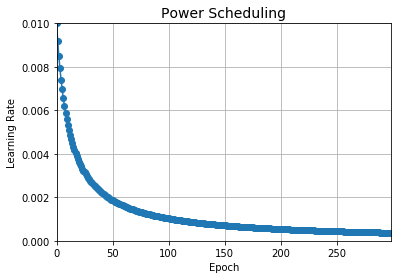

In [263]:
learning_rate = 0.01
decay = 3e-4
n_epochs=300
n_steps_per_epoch = len(X_train) // batch_size
epochs = np.arange(n_epochs)
lrs = learning_rate / (1 + decay * epochs * n_steps_per_epoch)

plt.plot(epochs, lrs,  "o-")
plt.axis([0, n_epochs - 1, 0, 0.01])
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Power Scheduling", fontsize=14)
plt.grid(True)
plt.show()

In [264]:
optimizer = keras.optimizers.Adam(lr=0.01, decay=3e-4)



DNN.compile(optimizer=optimizer, 
            loss='mean_absolute_error',
            metrics=['mean_absolute_error'])


history = DNN.fit(X_train, y_train,
                    epochs=500,batch_size=512,
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=1)

Train on 9317 samples, validate on 2330 samples
Epoch 1/500
8192/9317 [=========================>....] - ETA: 0s - loss: 11051.4324 - mean_absolute_error: 11051.4326
Epoch 00001: val_loss improved from inf to 4578.75720, saving model to Weights\Weights-001--4578.75720.hdf5
9317/9317 [==============================] - 3s 276us/sample - loss: 11041.6985 - mean_absolute_error: 11041.6982 - val_loss: 4578.7572 - val_mean_absolute_error: 4578.7573
Epoch 2/500
8192/9317 [=========================>....] - ETA: 0s - loss: 10350.3984 - mean_absolute_error: 10350.3975
Epoch 00002: val_loss improved from 4578.75720 to 3873.12768, saving model to Weights\Weights-002--3873.12768.hdf5
9317/9317 [==============================] - 0s 39us/sample - loss: 10245.3702 - mean_absolute_error: 10245.3691 - val_loss: 3873.1277 - val_mean_absolute_error: 3873.1274
Epoch 3/500
8192/9317 [=========================>....] - ETA: 0s - loss: 7626.3995 - mean_absolute_error: 7626.3994
Epoch 00003: val_loss did not im

Epoch 23/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1341.4948 - mean_absolute_error: 1341.4949
Epoch 00023: val_loss did not improve from 1295.80919
9317/9317 [==============================] - 0s 26us/sample - loss: 1346.2156 - mean_absolute_error: 1346.2156 - val_loss: 1368.3186 - val_mean_absolute_error: 1368.3186
Epoch 24/500
9216/9317 [============================>.] - ETA: 0s - loss: 1323.3428 - mean_absolute_error: 1323.3428
Epoch 00024: val_loss did not improve from 1295.80919
9317/9317 [==============================] - 0s 30us/sample - loss: 1321.0196 - mean_absolute_error: 1321.0197 - val_loss: 1338.5156 - val_mean_absolute_error: 1338.5156
Epoch 25/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1317.5699 - mean_absolute_error: 1317.5699
Epoch 00025: val_loss improved from 1295.80919 to 1281.50225, saving model to Weights\Weights-025--1281.50225.hdf5
9317/9317 [==============================] - 0s 37us/sample - loss: 1320.0881 - mean_a

Epoch 46/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1266.3664 - mean_absolute_error: 1266.3665
Epoch 00046: val_loss did not improve from 1190.46936
9317/9317 [==============================] - 0s 26us/sample - loss: 1263.5272 - mean_absolute_error: 1263.5273 - val_loss: 1207.7482 - val_mean_absolute_error: 1207.7483
Epoch 47/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1241.7416 - mean_absolute_error: 1241.7416
Epoch 00047: val_loss did not improve from 1190.46936
9317/9317 [==============================] - 0s 26us/sample - loss: 1243.3121 - mean_absolute_error: 1243.3121 - val_loss: 1196.6219 - val_mean_absolute_error: 1196.6219
Epoch 48/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1226.7963 - mean_absolute_error: 1226.7961
Epoch 00048: val_loss did not improve from 1190.46936
9317/9317 [==============================] - 0s 27us/sample - loss: 1235.4842 - mean_absolute_error: 1235.4840 - val_loss: 1214.0202 - val_mean_abs

Epoch 69/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1182.5691 - mean_absolute_error: 1182.5691
Epoch 00069: val_loss improved from 1165.82891 to 1160.12455, saving model to Weights\Weights-069--1160.12455.hdf5
9317/9317 [==============================] - 0s 37us/sample - loss: 1190.1968 - mean_absolute_error: 1190.1968 - val_loss: 1160.1246 - val_mean_absolute_error: 1160.1245
Epoch 70/500
7680/9317 [=======================>......] - ETA: 0s - loss: 1179.6711 - mean_absolute_error: 1179.6710
Epoch 00070: val_loss did not improve from 1160.12455
9317/9317 [==============================] - 0s 28us/sample - loss: 1176.5718 - mean_absolute_error: 1176.5718 - val_loss: 1170.0768 - val_mean_absolute_error: 1170.0768
Epoch 71/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1191.1023 - mean_absolute_error: 1191.1024
Epoch 00071: val_loss did not improve from 1160.12455
9317/9317 [==============================] - 0s 26us/sample - loss: 1184.1348 - mean_a

Epoch 00092: val_loss did not improve from 1152.84916
9317/9317 [==============================] - 0s 26us/sample - loss: 1155.5481 - mean_absolute_error: 1155.5481 - val_loss: 1205.6823 - val_mean_absolute_error: 1205.6823
Epoch 93/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1167.0490 - mean_absolute_error: 1167.0490
Epoch 00093: val_loss did not improve from 1152.84916
9317/9317 [==============================] - 0s 26us/sample - loss: 1161.7386 - mean_absolute_error: 1161.7385 - val_loss: 1171.7545 - val_mean_absolute_error: 1171.7545
Epoch 94/500
7680/9317 [=======================>......] - ETA: 0s - loss: 1149.8665 - mean_absolute_error: 1149.8665
Epoch 00094: val_loss did not improve from 1152.84916
9317/9317 [==============================] - 0s 31us/sample - loss: 1158.2843 - mean_absolute_error: 1158.2842 - val_loss: 1215.7179 - val_mean_absolute_error: 1215.7179
Epoch 95/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1156.0204 - mean_abs

8192/9317 [=========================>....] - ETA: 0s - loss: 1112.2140 - mean_absolute_error: 1112.2140
Epoch 00116: val_loss improved from 1146.68519 to 1144.91115, saving model to Weights\Weights-116--1144.91115.hdf5
9317/9317 [==============================] - 0s 42us/sample - loss: 1119.9755 - mean_absolute_error: 1119.9756 - val_loss: 1144.9111 - val_mean_absolute_error: 1144.9110
Epoch 117/500
8704/9317 [===========================>..] - ETA: 0s - loss: 1128.4488 - mean_absolute_error: 1128.4487
Epoch 00117: val_loss did not improve from 1144.91115
9317/9317 [==============================] - 0s 52us/sample - loss: 1127.8890 - mean_absolute_error: 1127.8890 - val_loss: 1158.2189 - val_mean_absolute_error: 1158.2189
Epoch 118/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1118.0798 - mean_absolute_error: 1118.0798
Epoch 00118: val_loss did not improve from 1144.91115
9317/9317 [==============================] - 0s 33us/sample - loss: 1118.3082 - mean_absolute_err

Epoch 140/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1096.0431 - mean_absolute_error: 1096.0432
Epoch 00140: val_loss did not improve from 1137.85596
9317/9317 [==============================] - 0s 27us/sample - loss: 1098.6249 - mean_absolute_error: 1098.6250 - val_loss: 1150.4133 - val_mean_absolute_error: 1150.4133
Epoch 141/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1099.9144 - mean_absolute_error: 1099.9144
Epoch 00141: val_loss improved from 1137.85596 to 1131.33543, saving model to Weights\Weights-141--1131.33543.hdf5
9317/9317 [==============================] - 0s 38us/sample - loss: 1096.9203 - mean_absolute_error: 1096.9204 - val_loss: 1131.3354 - val_mean_absolute_error: 1131.3354
Epoch 142/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1088.7887 - mean_absolute_error: 1088.7888
Epoch 00142: val_loss did not improve from 1131.33543
9317/9317 [==============================] - 0s 27us/sample - loss: 1096.1678 - mea

Epoch 164/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1085.4921 - mean_absolute_error: 1085.4921
Epoch 00164: val_loss did not improve from 1131.33543
9317/9317 [==============================] - 0s 25us/sample - loss: 1086.5374 - mean_absolute_error: 1086.5374 - val_loss: 1136.2000 - val_mean_absolute_error: 1136.2000
Epoch 165/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1070.0878 - mean_absolute_error: 1070.0878
Epoch 00165: val_loss did not improve from 1131.33543
9317/9317 [==============================] - 0s 25us/sample - loss: 1074.8930 - mean_absolute_error: 1074.8929 - val_loss: 1136.6591 - val_mean_absolute_error: 1136.6592
Epoch 166/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1075.2706 - mean_absolute_error: 1075.2706
Epoch 00166: val_loss did not improve from 1131.33543
9317/9317 [==============================] - 0s 25us/sample - loss: 1079.9728 - mean_absolute_error: 1079.9729 - val_loss: 1141.7605 - val_mean_

8192/9317 [=========================>....] - ETA: 0s - loss: 1062.7491 - mean_absolute_error: 1062.7490
Epoch 00187: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 27us/sample - loss: 1063.8788 - mean_absolute_error: 1063.8787 - val_loss: 1138.7721 - val_mean_absolute_error: 1138.7720
Epoch 188/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1070.0546 - mean_absolute_error: 1070.0546
Epoch 00188: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 25us/sample - loss: 1073.5825 - mean_absolute_error: 1073.5825 - val_loss: 1131.0673 - val_mean_absolute_error: 1131.0674
Epoch 189/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1052.8002 - mean_absolute_error: 1052.8003
Epoch 00189: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 26us/sample - loss: 1055.8327 - mean_absolute_error: 1055.8328 - val_loss: 1144.0881 - val_mean_absolute_error

Epoch 211/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1059.7832 - mean_absolute_error: 1059.7833
Epoch 00211: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 25us/sample - loss: 1058.4789 - mean_absolute_error: 1058.4790 - val_loss: 1144.7081 - val_mean_absolute_error: 1144.7081
Epoch 212/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1037.9576 - mean_absolute_error: 1037.9576
Epoch 00212: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 26us/sample - loss: 1043.5053 - mean_absolute_error: 1043.5052 - val_loss: 1133.9073 - val_mean_absolute_error: 1133.9073
Epoch 213/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1045.8251 - mean_absolute_error: 1045.8251
Epoch 00213: val_loss did not improve from 1125.26700
9317/9317 [==============================] - 0s 26us/sample - loss: 1052.4627 - mean_absolute_error: 1052.4626 - val_loss: 1167.5622 - val_mean_

Epoch 235/500
7680/9317 [=======================>......] - ETA: 0s - loss: 1041.3768 - mean_absolute_error: 1041.3767
Epoch 00235: val_loss did not improve from 1120.03198
9317/9317 [==============================] - 0s 27us/sample - loss: 1041.4294 - mean_absolute_error: 1041.4294 - val_loss: 1126.3023 - val_mean_absolute_error: 1126.3024
Epoch 236/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1031.5115 - mean_absolute_error: 1031.5116
Epoch 00236: val_loss did not improve from 1120.03198
9317/9317 [==============================] - 0s 25us/sample - loss: 1027.7964 - mean_absolute_error: 1027.7964 - val_loss: 1125.0920 - val_mean_absolute_error: 1125.0920
Epoch 237/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1046.7107 - mean_absolute_error: 1046.7108
Epoch 00237: val_loss improved from 1120.03198 to 1119.62488, saving model to Weights\Weights-237--1119.62488.hdf5
9317/9317 [==============================] - 0s 36us/sample - loss: 1041.1312 - mea

Epoch 259/500
7680/9317 [=======================>......] - ETA: 0s - loss: 1009.4758 - mean_absolute_error: 1009.4758
Epoch 00259: val_loss did not improve from 1119.33668
9317/9317 [==============================] - 0s 28us/sample - loss: 1017.1627 - mean_absolute_error: 1017.1628 - val_loss: 1132.4948 - val_mean_absolute_error: 1132.4949
Epoch 260/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1037.0968 - mean_absolute_error: 1037.0968
Epoch 00260: val_loss improved from 1119.33668 to 1118.16537, saving model to Weights\Weights-260--1118.16537.hdf5
9317/9317 [==============================] - 0s 35us/sample - loss: 1032.8552 - mean_absolute_error: 1032.8552 - val_loss: 1118.1654 - val_mean_absolute_error: 1118.1654
Epoch 261/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1002.5464 - mean_absolute_error: 1002.5464
Epoch 00261: val_loss did not improve from 1118.16537
9317/9317 [==============================] - 0s 26us/sample - loss: 1008.7306 - mea

8192/9317 [=========================>....] - ETA: 0s - loss: 1022.7694 - mean_absolute_error: 1022.7694
Epoch 00282: val_loss did not improve from 1114.21590
9317/9317 [==============================] - 0s 25us/sample - loss: 1023.8234 - mean_absolute_error: 1023.8234 - val_loss: 1127.1780 - val_mean_absolute_error: 1127.1780
Epoch 283/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1020.0803 - mean_absolute_error: 1020.0802
Epoch 00283: val_loss did not improve from 1114.21590
9317/9317 [==============================] - 0s 25us/sample - loss: 1019.8691 - mean_absolute_error: 1019.8690 - val_loss: 1123.0110 - val_mean_absolute_error: 1123.0110
Epoch 284/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1011.3862 - mean_absolute_error: 1011.3862
Epoch 00284: val_loss did not improve from 1114.21590
9317/9317 [==============================] - 0s 26us/sample - loss: 1012.1329 - mean_absolute_error: 1012.1330 - val_loss: 1133.9724 - val_mean_absolute_error

Epoch 306/500
8192/9317 [=========================>....] - ETA: 0s - loss: 998.7416 - mean_absolute_error: 998.7416  
Epoch 00306: val_loss did not improve from 1112.32920
9317/9317 [==============================] - 0s 30us/sample - loss: 995.7013 - mean_absolute_error: 995.7013 - val_loss: 1123.1222 - val_mean_absolute_error: 1123.1222
Epoch 307/500
8192/9317 [=========================>....] - ETA: 0s - loss: 993.9072 - mean_absolute_error: 993.9072
Epoch 00307: val_loss did not improve from 1112.32920
9317/9317 [==============================] - 0s 26us/sample - loss: 995.4795 - mean_absolute_error: 995.4794 - val_loss: 1116.7362 - val_mean_absolute_error: 1116.7362
Epoch 308/500
8192/9317 [=========================>....] - ETA: 0s - loss: 998.1676 - mean_absolute_error: 998.1677
Epoch 00308: val_loss did not improve from 1112.32920
9317/9317 [==============================] - 0s 26us/sample - loss: 1006.3985 - mean_absolute_error: 1006.3985 - val_loss: 1128.3374 - val_mean_absolute

Epoch 330/500
8192/9317 [=========================>....] - ETA: 0s - loss: 996.8292 - mean_absolute_error: 996.8291
Epoch 00330: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 26us/sample - loss: 1001.5830 - mean_absolute_error: 1001.5829 - val_loss: 1121.3048 - val_mean_absolute_error: 1121.3047
Epoch 331/500
8192/9317 [=========================>....] - ETA: 0s - loss: 1004.8499 - mean_absolute_error: 1004.8500
Epoch 00331: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 27us/sample - loss: 999.3658 - mean_absolute_error: 999.3658 - val_loss: 1131.2756 - val_mean_absolute_error: 1131.2756
Epoch 332/500
9216/9317 [============================>.] - ETA: 0s - loss: 994.1245 - mean_absolute_error: 994.1245
Epoch 00332: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 29us/sample - loss: 994.7851 - mean_absolute_error: 994.7851 - val_loss: 1128.0955 - val_mean_absolute

8192/9317 [=========================>....] - ETA: 0s - loss: 991.4836 - mean_absolute_error: 991.4835 
Epoch 00354: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 25us/sample - loss: 993.6904 - mean_absolute_error: 993.6904 - val_loss: 1112.5723 - val_mean_absolute_error: 1112.5723
Epoch 355/500
8192/9317 [=========================>....] - ETA: 0s - loss: 984.3049 - mean_absolute_error: 984.3049
Epoch 00355: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 26us/sample - loss: 990.6321 - mean_absolute_error: 990.6321 - val_loss: 1123.9390 - val_mean_absolute_error: 1123.9391
Epoch 356/500
8192/9317 [=========================>....] - ETA: 0s - loss: 981.6555 - mean_absolute_error: 981.6556
Epoch 00356: val_loss did not improve from 1108.51905
9317/9317 [==============================] - 0s 25us/sample - loss: 979.6935 - mean_absolute_error: 979.6935 - val_loss: 1121.2551 - val_mean_absolute_error: 1121.2550

8192/9317 [=========================>....] - ETA: 0s - loss: 977.2956 - mean_absolute_error: 977.2956
Epoch 00378: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 979.7067 - mean_absolute_error: 979.7068 - val_loss: 1116.8398 - val_mean_absolute_error: 1116.8400
Epoch 379/500
8192/9317 [=========================>....] - ETA: 0s - loss: 999.8808 - mean_absolute_error: 999.8808  
Epoch 00379: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 994.2827 - mean_absolute_error: 994.2828 - val_loss: 1121.1063 - val_mean_absolute_error: 1121.1062
Epoch 380/500
8192/9317 [=========================>....] - ETA: 0s - loss: 985.3700 - mean_absolute_error: 985.3699
Epoch 00380: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 981.5822 - mean_absolute_error: 981.5822 - val_loss: 1117.6922 - val_mean_absolute_error: 1117.692

8192/9317 [=========================>....] - ETA: 0s - loss: 966.5762 - mean_absolute_error: 966.5762
Epoch 00402: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 26us/sample - loss: 965.9512 - mean_absolute_error: 965.9512 - val_loss: 1118.0472 - val_mean_absolute_error: 1118.0472
Epoch 403/500
8192/9317 [=========================>....] - ETA: 0s - loss: 971.6201 - mean_absolute_error: 971.6201
Epoch 00403: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 972.3164 - mean_absolute_error: 972.3164 - val_loss: 1126.6656 - val_mean_absolute_error: 1126.6655
Epoch 404/500
8192/9317 [=========================>....] - ETA: 0s - loss: 974.9358 - mean_absolute_error: 974.9358
Epoch 00404: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 974.1380 - mean_absolute_error: 974.1379 - val_loss: 1121.8819 - val_mean_absolute_error: 1121.8818


8192/9317 [=========================>....] - ETA: 0s - loss: 971.5802 - mean_absolute_error: 971.5801
Epoch 00426: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 27us/sample - loss: 970.2918 - mean_absolute_error: 970.2917 - val_loss: 1118.6903 - val_mean_absolute_error: 1118.6902
Epoch 427/500
8192/9317 [=========================>....] - ETA: 0s - loss: 957.3044 - mean_absolute_error: 957.3044
Epoch 00427: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 26us/sample - loss: 957.4732 - mean_absolute_error: 957.4732 - val_loss: 1125.7811 - val_mean_absolute_error: 1125.7812
Epoch 428/500
8192/9317 [=========================>....] - ETA: 0s - loss: 971.3776 - mean_absolute_error: 971.3776
Epoch 00428: val_loss did not improve from 1105.56441
9317/9317 [==============================] - 0s 25us/sample - loss: 973.8595 - mean_absolute_error: 973.8594 - val_loss: 1110.4628 - val_mean_absolute_error: 1110.4628


8192/9317 [=========================>....] - ETA: 0s - loss: 961.1531 - mean_absolute_error: 961.1531
Epoch 00450: val_loss did not improve from 1104.40354
9317/9317 [==============================] - 0s 26us/sample - loss: 956.8170 - mean_absolute_error: 956.8169 - val_loss: 1122.3902 - val_mean_absolute_error: 1122.3903
Epoch 451/500
8192/9317 [=========================>....] - ETA: 0s - loss: 972.0263 - mean_absolute_error: 972.0263
Epoch 00451: val_loss did not improve from 1104.40354
9317/9317 [==============================] - 0s 25us/sample - loss: 975.2360 - mean_absolute_error: 975.2360 - val_loss: 1114.9852 - val_mean_absolute_error: 1114.9854
Epoch 452/500
8192/9317 [=========================>....] - ETA: 0s - loss: 980.4586 - mean_absolute_error: 980.4586
Epoch 00452: val_loss did not improve from 1104.40354
9317/9317 [==============================] - 0s 25us/sample - loss: 977.4217 - mean_absolute_error: 977.4218 - val_loss: 1116.9706 - val_mean_absolute_error: 1116.9706


7680/9317 [=======================>......] - ETA: 0s - loss: 957.4156 - mean_absolute_error: 957.4156
Epoch 00474: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 27us/sample - loss: 952.0581 - mean_absolute_error: 952.0580 - val_loss: 1115.0530 - val_mean_absolute_error: 1115.0530
Epoch 475/500
8192/9317 [=========================>....] - ETA: 0s - loss: 971.0351 - mean_absolute_error: 971.0350
Epoch 00475: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 26us/sample - loss: 969.1397 - mean_absolute_error: 969.1396 - val_loss: 1120.4870 - val_mean_absolute_error: 1120.4872
Epoch 476/500
8192/9317 [=========================>....] - ETA: 0s - loss: 953.4390 - mean_absolute_error: 953.4391
Epoch 00476: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 26us/sample - loss: 951.6529 - mean_absolute_error: 951.6529 - val_loss: 1114.9440 - val_mean_absolute_error: 1114.9440


8192/9317 [=========================>....] - ETA: 0s - loss: 962.5503 - mean_absolute_error: 962.5504
Epoch 00498: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 25us/sample - loss: 960.3124 - mean_absolute_error: 960.3124 - val_loss: 1119.6603 - val_mean_absolute_error: 1119.6603
Epoch 499/500
8192/9317 [=========================>....] - ETA: 0s - loss: 945.4689 - mean_absolute_error: 945.4690
Epoch 00499: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 25us/sample - loss: 944.9721 - mean_absolute_error: 944.9722 - val_loss: 1117.7238 - val_mean_absolute_error: 1117.7238
Epoch 500/500
8192/9317 [=========================>....] - ETA: 0s - loss: 962.0063 - mean_absolute_error: 962.0064
Epoch 00500: val_loss did not improve from 1100.21113
9317/9317 [==============================] - 0s 33us/sample - loss: 963.2663 - mean_absolute_error: 963.2664 - val_loss: 1117.8309 - val_mean_absolute_error: 1117.8309


In [265]:
import glob
import os

list_of_files = glob.glob('Weights/*') # * means all if need specific format then *.csv
latest_file = max(list_of_files, key=os.path.getmtime)

In [266]:
latest_file

'Weights\\Weights-469--1100.21113.hdf5'

In [267]:
weights_file =  latest_file# choose the best checkpoint 
DNN.load_weights(weights_file) # load it
DNN.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

In [268]:
DNN_plot_loss(history,starting_epoch=20)

In [269]:
df_summary_dnn=performance_summary(DNN,X_test, y_test)


Share of forecasts within 25% absolute error 0.931

Share of forecasts within 10% absolute error 0.653

Share of forecasts within 5% absolute error 0.414



In [270]:
df_summary_dnn_coors=pd.concat([df_summary_dnn,X_test_coors], axis=1)

In [271]:
df_summary_dnn.describe()

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
count,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000
mean,10942.527344,11097.735622,1100.211135,-155.211223,0.002753,0.095281
std,2537.212158,2988.497025,1272.947575,1675.493640,0.140450,0.103205
min,6452.176758,5083.000000,0.879883,-11007.716797,-0.461636,0.000069
25%,9057.850098,8998.500000,281.035889,-778.851318,-0.068638,0.027491
50%,10745.249023,10663.500000,671.886719,-49.586670,-0.004969,0.064488
75%,12317.465820,12517.250000,1416.550781,608.753418,0.059188,0.130752
max,21360.548828,25000.000000,11007.716797,9201.318359,1.376197,1.376197


In [272]:
df_summary_dnn

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
0,11462.232422,10408,1054.232422,1054.232422,0.101291,0.101291
1,10310.259766,9400,910.259766,910.259766,0.096836,0.096836
2,10994.518555,9880,1114.518555,1114.518555,0.112806,0.112806
3,11329.857422,10993,336.857422,336.857422,0.030643,0.030643
4,9650.087891,10755,1104.912109,-1104.912109,-0.102735,0.102735
...,...,...,...,...,...,...
2325,11708.642578,16759,5050.357422,-5050.357422,-0.301352,0.301352
2326,13763.368164,10701,3062.368164,3062.368164,0.286176,0.286176
2327,9812.631836,10625,812.368164,-812.368164,-0.076458,0.076458
2328,11244.953125,10285,959.953125,959.953125,0.093335,0.093335


In [273]:
plot_predictions(df_summary_dnn)

In [274]:
df_map=df_summary_dnn_coors[["lat_mod","lon_mod","relative_error","relative_abs_error","abs_error","error","y_hat","y_true"]].groupby(["lat_mod","lon_mod"], as_index=False).mean()

## Plotting predictions on map

In [275]:
def create_geojson(x,y,z,div_space,z_min):
    xi = linspace(x.min(),x.max(),100);
    yi = linspace(y.min(),y.max(),100);
    zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method="linear")

    cs = plt.contourf(xi,yi,zi,range(int(z_min),int(np.nanmax(zi))+div_space,div_space),cmap=plt.cm.jet)
    
    

    geojson = geojsoncontour.contourf_to_geojson(
    contourf=cs,
    ndigits=3,
   
    )

    json_dict=eval(geojson)
    
    arr_temp=np.ones([len(json_dict["features"]),2])
    
    for i in range(0, len(json_dict["features"])):
        json_dict["features"][i]["id"]=i

    
        arr_temp[i,0]=i
        arr_temp[i,1]=float(json_dict["features"][i]["properties"]["title"])+div_space
    
    df_contour=pd.DataFrame(arr_temp, columns=["Id","value"])
   
    
    return(json_dict, df_contour)


In [276]:
def plot_geojson_countour(geojson, df, title, zmin, zmax):
    trace = go.Choroplethmapbox(
                                geojson=geojson,
                                locations=df.Id,
                                z=df.value,
                                colorscale="jet",
                                zauto=False,
                                zmin=zmin,
                                zmax=zmax,

                                marker_line_width=0,

                                marker=dict(opacity=0.5),

                               )
    layout = go.Layout(
        title=title,




        height = 800,
        # top, bottom, left and right margins
        margin = dict(t = 80, b = 0, l = 0, r = 0),
        font = dict(color = 'dark grey', size = 18),

        mapbox = dict(


            center = dict(
                lat = center_coors[0],
                lon = center_coors[1]
            ),
            # default level of zoom
            zoom = 11,
            # default map style
            style = "carto-positron"
        )

    )

    figure=dict(
        data=[trace],
        layout=layout,


        )

    iplot(figure)

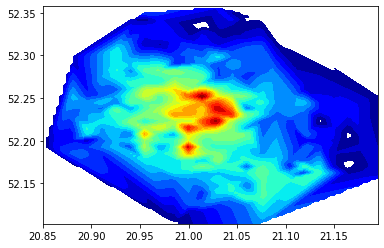

In [277]:
hat_geojson, df_hat=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.y_hat,500,7000)

In [278]:
plot_geojson_countour(hat_geojson, df_hat,"Test set mean predicted prices[PLN/m2]",5000,20000)

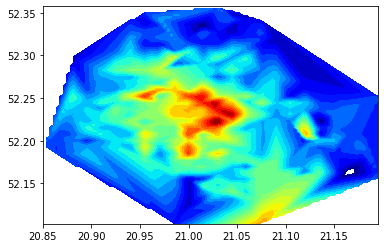

In [279]:
true_geojson, df_true=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.y_true,500,6000)

In [280]:
plot_geojson_countour(true_geojson, df_true,"Test set mean actual prices[PLN/m2]",5000,20000)

## Error spatial analysis

In [281]:
df_map["relative_error"]=df_map["relative_error"]*100

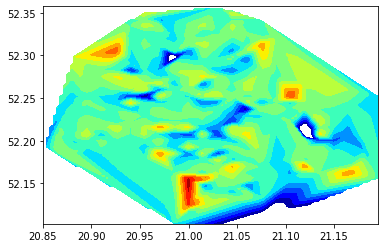

In [282]:
error_geojson, df_error=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.error,500,-3000)

In [283]:
plot_geojson_countour(error_geojson, df_error,"Error geoanalysis [PLN/m2]",-2000,2000)

It seems we are missing some feature describing cultural life in a given district as geoanalysis shows that the model is underestimating the most in areas which are "popular" with vivid cultural life and overestimating in unpopular districts. To improve the results we will need additional geo data from google dealing with restaurants, museum etc. 

In [284]:
df_map.relative_error.describe()

count    314.000000
mean       0.655809
std        9.887478
min      -38.858933
25%       -3.682364
50%       -0.107244
75%        4.862889
max       51.766722
Name: relative_error, dtype: float64

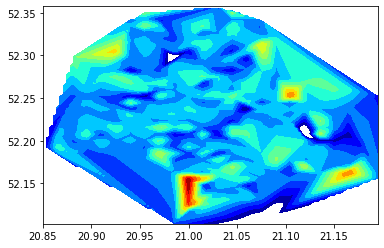

In [285]:
rel_error_geojson, df_rel_error=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.relative_error,5,-20)

In [286]:
plot_geojson_countour(rel_error_geojson, df_rel_error,"Relative Error geoanalysis [%]",-20,20)